# Data Visualization

Once upon a time there were plots upon plots upon plots.

## Load data

In [1]:
import pandas as pd
import sys
sys.path.append('../')
from source.bokeh_plots import *
from source.data_visualization import *
output_notebook()

file_path = '../data/alma_main_results.xlsx'
model_name = 'AML Epigenomic Risk'

# Read the data
df = pd.read_excel(file_path, index_col=0).sort_index()

# Define train and test samples
df_train = df[df['Train-Test']=='Train Sample']
df_test = df[df['Train-Test'] == 'Test Sample']

# Drop the samples with missing labels for the selected column
df_px = df_train[~df_train['Vital Status'].isna()]
df_px = df_px[~df_px['Batch'].isin(['GDC_TARGET-ALL'])]

# drop the samples with missing labels for the ELN AML 2022 Diagnosis
df_dx = df_train[~df_train['WHO 2022 Diagnosis'].isna()]

# exclude the classes with fewer than 10 samples
df_dx = df_dx[~df_dx['WHO 2022 Diagnosis'].isin([
                                       'MPAL with t(v;11q23.3)/KMT2A-r',
                                       'B-ALL with hypodiploidy',
                                       'AML with t(16;21); FUS::ERG',
                                       'AML with t(9;22); BCR::ABL1'
                                       ])]

### Select samples from COG AAML1031, 0531, and 03P1 Dx samples
df_cog = df[df['Clinical Trial'].isin(['AAML0531', 'AAML1031', 'AAML03P1'])]
df_cog = df_cog[df_cog['Sample Type'].isin(['Diagnosis', 'Primary Blood Derived Cancer - Bone Marrow',
                                            'Primary Blood Derived Cancer - Peripheral Blood'])]
df_cog = df_cog[~df_cog['Patient_ID'].duplicated(keep='last')]

Loading BokehJS ...

## Interactive atlas

In [2]:
plot_linked_scatters(df)

## Patient Characteristics

### Foundation (unsupervised) model

In [3]:
from tableone import TableOne
from datetime import date

columns = ['Hematopoietic Entity','Age (group years)','Sex',
            'Clinical Trial',]

mytable_cog = TableOne(df_train.reset_index(), columns,
                        overall=False, missing=False,
                        pval=False, pval_adjust=False,
                        htest_name=True,dip_test=True,
                        tukey_test=True, normal_test=True,

                        order={'FLT3 ITD':['Yes','No'],
                                'Age (group years)':['0-5','5-13','13-39','39-60'],
                                'MRD 1 Status': ['Positive'],
                                'Risk Group': ['High Risk', 'Standard Risk'],
                                'FLT3 ITD': ['Yes'],
                                'Leucocyte counts (10⁹/L)': ['≥30'],
                                'Age group (years)': ['≥10']})

mytable_cog.to_excel('../data/pt_characteristics_alma_model_' + str(date.today()) +'.xlsx')

mytable_cog.tabulate(tablefmt="html", 
                        # headers=[score_name,"",'Missing','Discovery','Validation','p-value','Statistical Test']
                        )

,,Overall
n,,3308
"Hematopoietic Entity, n (%)",Acute lymphoblastic leukemia (ALL),700 (28.4)
,Acute myeloid leukemia (AML),1207 (49.0)
,Acute promyelocytic leukemia (APL),31 (1.3)
,Mixed phenotype acute leukemia (MPAL),50 (2.0)
,Myelodysplastic syndrome (MDS or MDS-like),225 (9.1)
,Otherwise-Normal (Control),251 (10.2)
"Age (group years), n (%)",0-5,480 (24.1)
,5-13,482 (24.2)
,13-39,658 (33.1)


### Fine-tuned (supervised) models

In [4]:
columns = ['Age (years)','Age group (years)','Sex','Race or ethnic group',
            'Hispanic or Latino ethnic group', 'MRD 1 Status',
            'Leucocyte counts (10⁹/L)', 'BM leukemic blasts (%)',
            'Risk Group','FLT3 ITD', 'Clinical Trial']

df_test['Age (years)'] = df_test['Age (years)'].astype(float)

# join discovery clinical data with validation clinical data
all_cohorts = pd.concat([df_dx, df_px, df_test],
                         axis=0, keys=['AL Epigenomic Subtype','AML Epigenomic Risk' ,'Validation'],
                         names=['cohort']).reset_index()

# columns = ['Age group (years)','Sex', 'MRD 1 Status',
#             'Leucocyte counts (10⁹/L)',
#             'Risk Group','FLT3 ITD', 'Treatment Arm','Clinical Trial']

mytable_cog = TableOne(all_cohorts, columns,
                        overall=False, missing=False,
                        pval=False, pval_adjust=False,
                        htest_name=True,dip_test=True,
                        tukey_test=True, normal_test=True,

                        order={'FLT3 ITD':['Yes','No'],
                                'Race or ethnic group':['White','Black or African American','Asian'],
                                'MRD 1 Status': ['Positive'],
                                'Risk Group': ['High Risk', 'Standard Risk'],
                                'FLT3 ITD': ['Yes'],
                                'Leucocyte counts (10⁹/L)': ['≥30'],
                                'Age group (years)': ['≥10']},
                                groupby='cohort')

mytable_cog.to_excel('../data/pt_characteristics_fine-tuned_models_' + str(date.today()) +'.xlsx')

mytable_cog.tabulate(tablefmt="html", 
                        # headers=[score_name,"",score_name,'Validation','p-value','Statistical Test']
)

,,AL Epigenomic Subtype,AML Epigenomic Risk,Validation
n,,2445,1797,201
"Age (years), mean (SD)",,19.3 (19.8),19.8 (21.6),8.8 (6.0)
"Age group (years), n (%)",≥10,520 (47.2),644 (48.2),95 (47.7)
,<10,581 (52.8),693 (51.8),104 (52.3)
"Sex, n (%)",Female,702 (50.4),853 (49.2),87 (43.3)
,Male,691 (49.6),879 (50.8),114 (56.7)
"Race or ethnic group, n (%)",White,1052 (80.4),1302 (80.4),143 (71.9)
,Black or African American,131 (10.0),155 (9.6),32 (16.1)
,Asian,65 (5.0),87 (5.4),1 (0.5)
,American Indian or Alaska Native,7 (0.5),8 (0.5),


### By prognostic group

#### Discovery

In [8]:
def pt_characteristics_by_model(df, model_name, traintest = 'discovery'):
        columns = ['Age (years)','Age group (years)','Sex','Race or ethnic group',
                'Hispanic or Latino ethnic group', 'MRD 1 Status',
                'Leucocyte counts (10⁹/L)', 'BM leukemic blasts (%)',
                'Risk Group', 'Clinical Trial','FLT3 ITD', 'Treatment Arm']

        mytable_cog = TableOne(df, columns,
                                overall=False, missing=False,
                                pval=True, pval_adjust=False,
                                htest_name=True,dip_test=True,
                                tukey_test=True, normal_test=True,

                                order={'FLT3 ITD':['Yes','No'],
                                        'Race or ethnic group':['White','Black or African American','Asian'],
                                        'MRD 1 Status': ['Positive'],
                                        'Risk Group': ['High Risk', 'Standard Risk'],
                                        'FLT3 ITD': ['Yes'],
                                        'Leucocyte counts (10⁹/L)': ['≥30'],
                                        'Age group (years)': ['≥10']},
                                groupby=model_name)

        mytable_cog.to_excel('../data/pt_characteristics_'+ model_name +'_' + traintest + '_' + str(date.today()) + '.xlsx')

        return(mytable_cog.tabulate(tablefmt="html", 
                                headers=[model_name + ' ' + traintest,"",'High','Low','p-value','Statistical Test']))

pt_characteristics_by_model(df_px, model_name, 'discovery')

AML Epigenomic Risk discovery,,High,Low,p-value,Statistical Test
n,,849,948,,
"Age (years), mean (SD)",,23.8 (24.7),16.0 (17.6),<0.001,Two Sample T-test
"Age group (years), n (%)",≥10,303 (50.9),341 (46.0),0.080,Chi-squared
,<10,292 (49.1),401 (54.0),,
"Sex, n (%)",Female,395 (47.6),458 (50.8),0.202,Chi-squared
,Male,435 (52.4),444 (49.2),,
"Race or ethnic group, n (%)",White,636 (80.6),666 (80.2),0.404,Chi-squared (warning: expected count < 5)
,Black or African American,81 (10.3),74 (8.9),,
,Asian,42 (5.3),45 (5.4),,
,American Indian or Alaska Native,4 (0.5),4 (0.5),,


#### Validation

In [9]:
pt_characteristics_by_model(df_test, model_name, 'validation')

AML Epigenomic Risk validation,,High,Low,p-value,Statistical Test
n,,73,128,,
"Age (years), mean (SD)",,8.7 (6.3),8.8 (5.8),0.851,Two Sample T-test
"Age group (years), n (%)",≥10,34 (47.2),61 (48.0),1.000,Chi-squared
,<10,38 (52.8),66 (52.0),,
"Sex, n (%)",Female,32 (43.8),55 (43.0),1.000,Chi-squared
,Male,41 (56.2),73 (57.0),,
"Race or ethnic group, n (%)",White,49 (69.0),94 (73.4),0.698,Chi-squared (warning: expected count < 5)
,Black or African American,12 (16.9),20 (15.6),,
,Asian,1 (1.4),,,
,Native Hawaiian or other Pacific Islander,1 (1.4),1 (0.8),,


## Kaplan-Meier Plots

### Overall study population

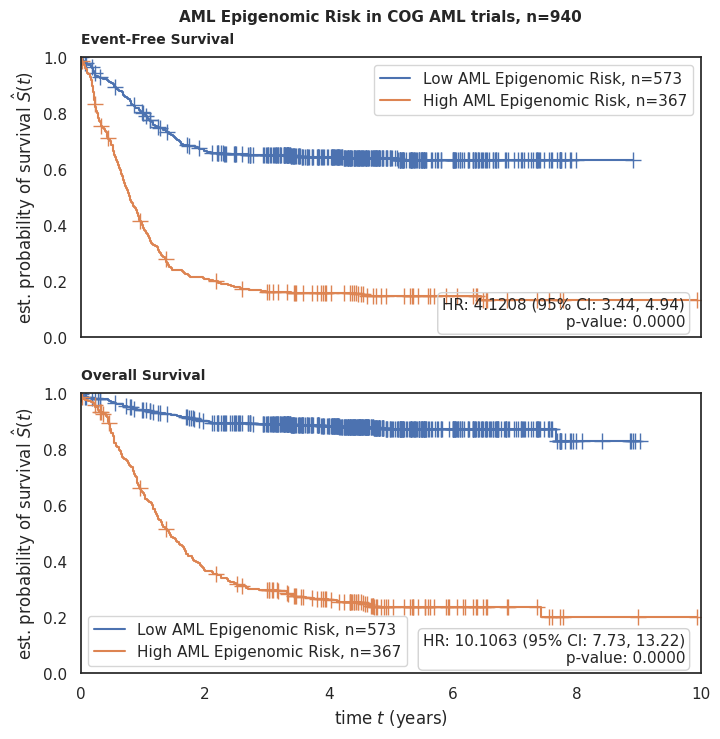

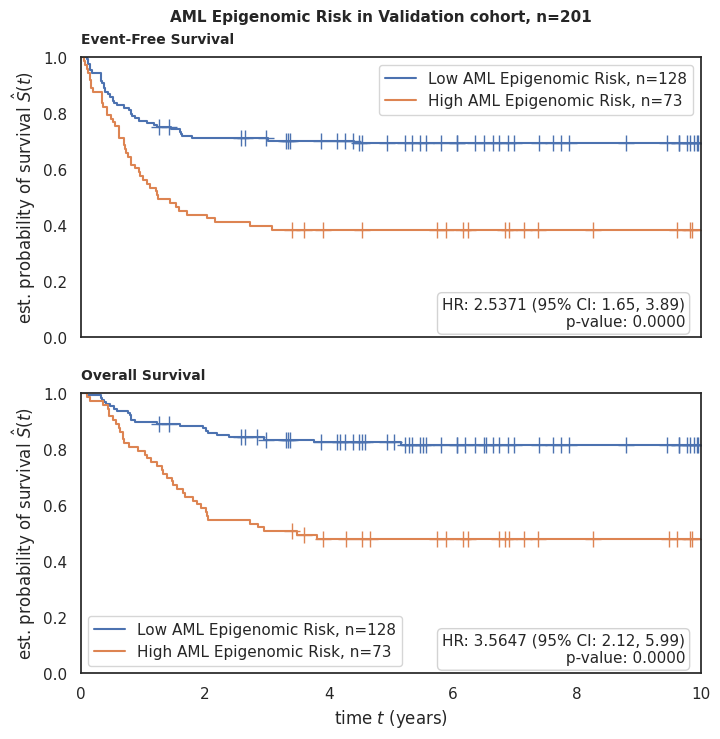

In [10]:

for dataset, trial in zip([df_cog, df_test], 
                          ['COG AML trials', 'Validation cohort']):
    draw_kaplan_meier(model_name=model_name,
                        df=dataset,
                        save_survival_table=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=False,
                        trialname=trial,
                        figsize=(8,8))

### Per risk group

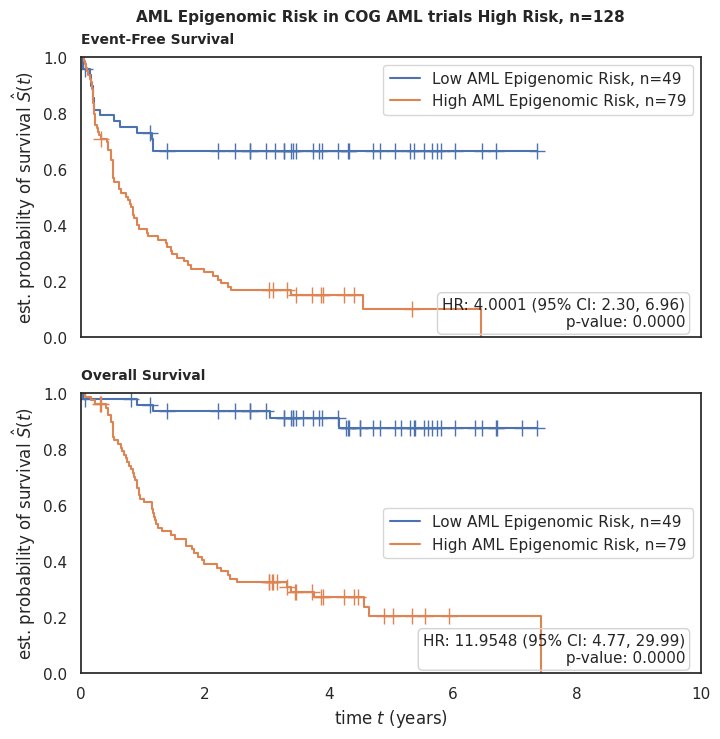

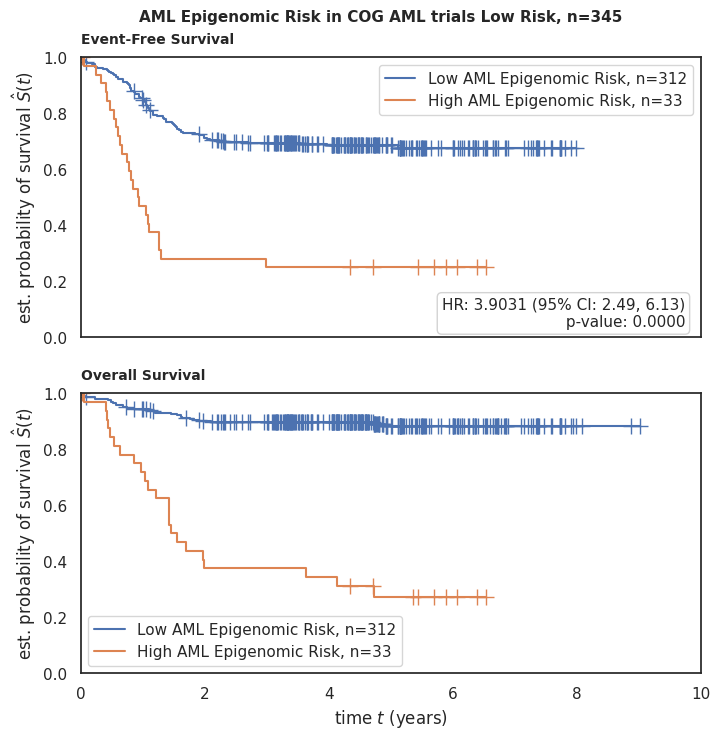

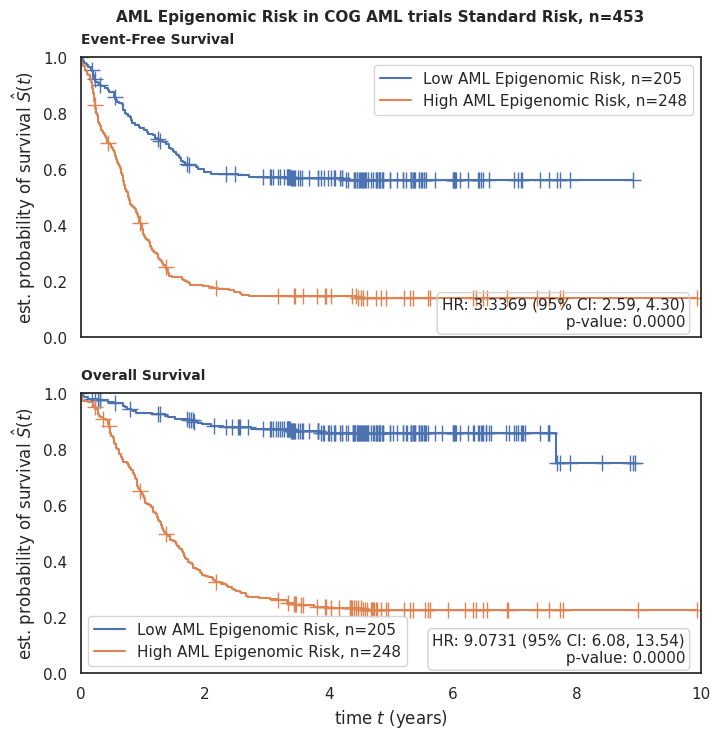

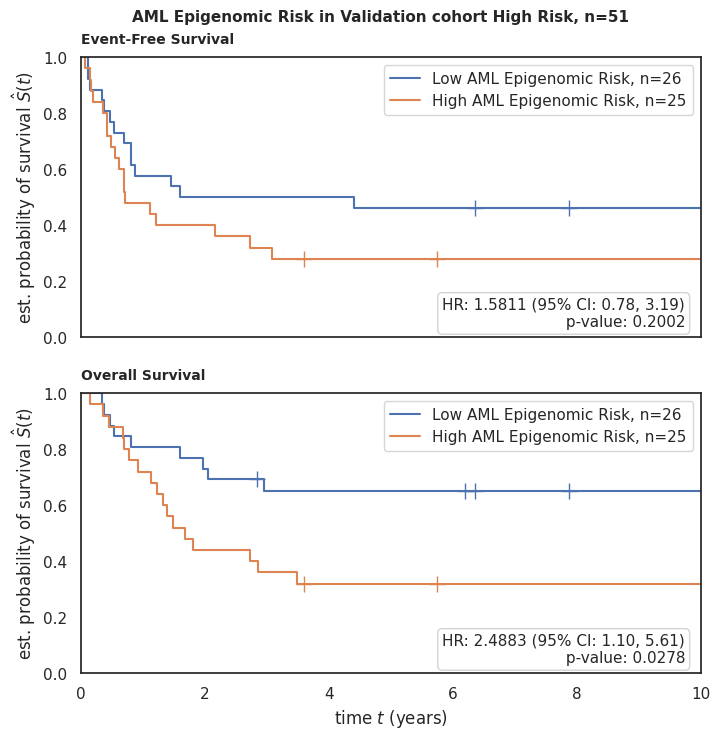

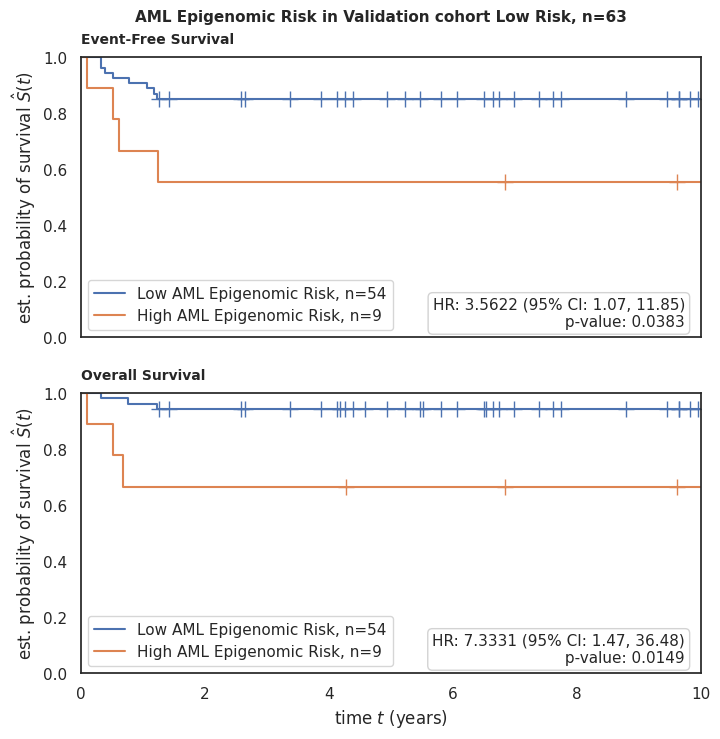

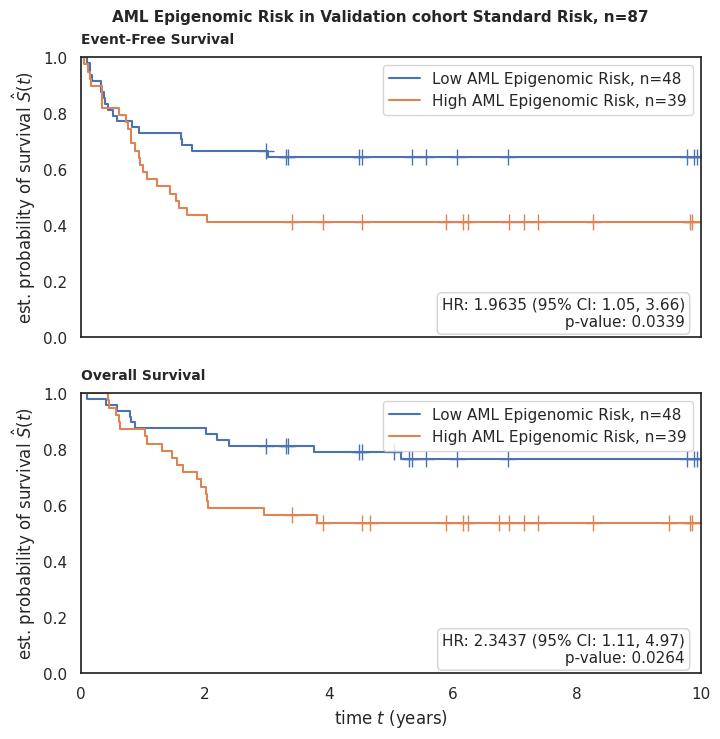

In [11]:
for dataset, trial in zip([df_cog, df_test], ['COG AML trials', 'Validation cohort']):

    risk_groups = ['High Risk', 'Low Risk', 'Standard Risk']
    for risk_group in risk_groups:
        draw_kaplan_meier(
            model_name=model_name,
            df=dataset[dataset['Risk Group'] == risk_group],
            save_plot=False,
            save_survival_table=False,
            add_risk_counts=False,
            trialname=f'{trial} {risk_group}',
            figsize=(8, 8))


### Per risk group (AAML1831 COG)

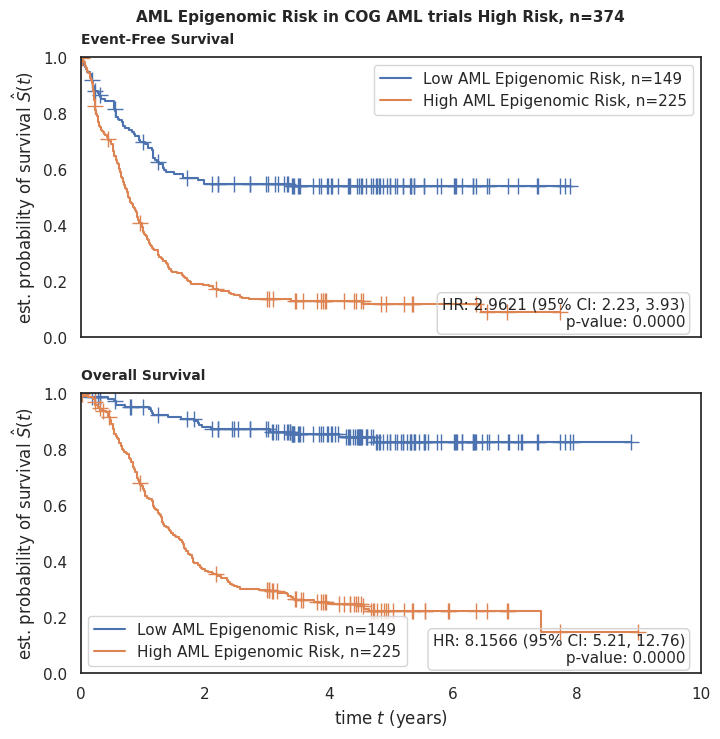

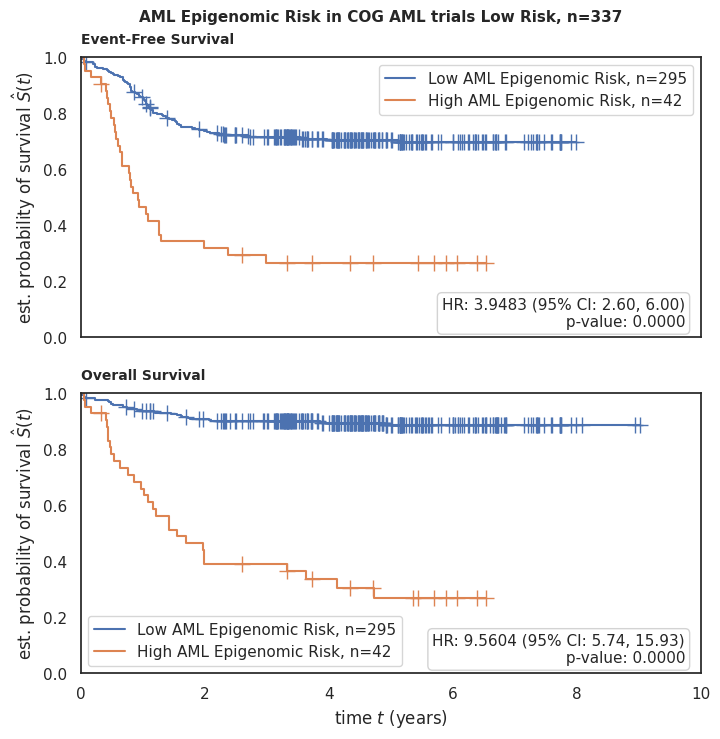

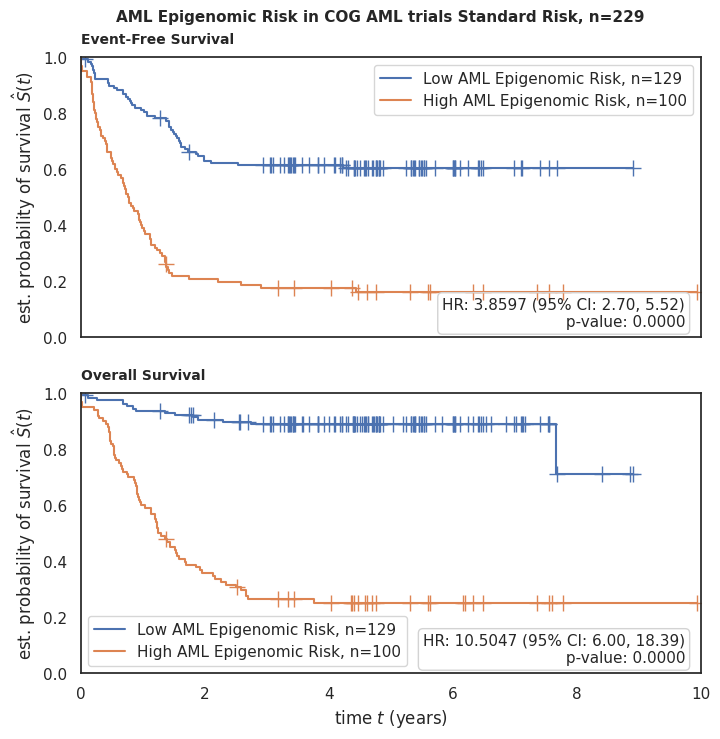

In [12]:
for dataset, trial in zip([df_cog],['COG AML trials']):

    risk_groups = ['High', 'Low', 'Standard']
    for risk_group in risk_groups:
        draw_kaplan_meier(
            model_name=model_name,
            df=dataset[dataset['Risk Group AAML1831'] == risk_group],
            save_plot=False,
            save_survival_table=False,
            add_risk_counts=False,
            trialname=f'{trial} {risk_group} Risk',
            figsize=(8, 8))


## Forest Plots

### With MRD 1

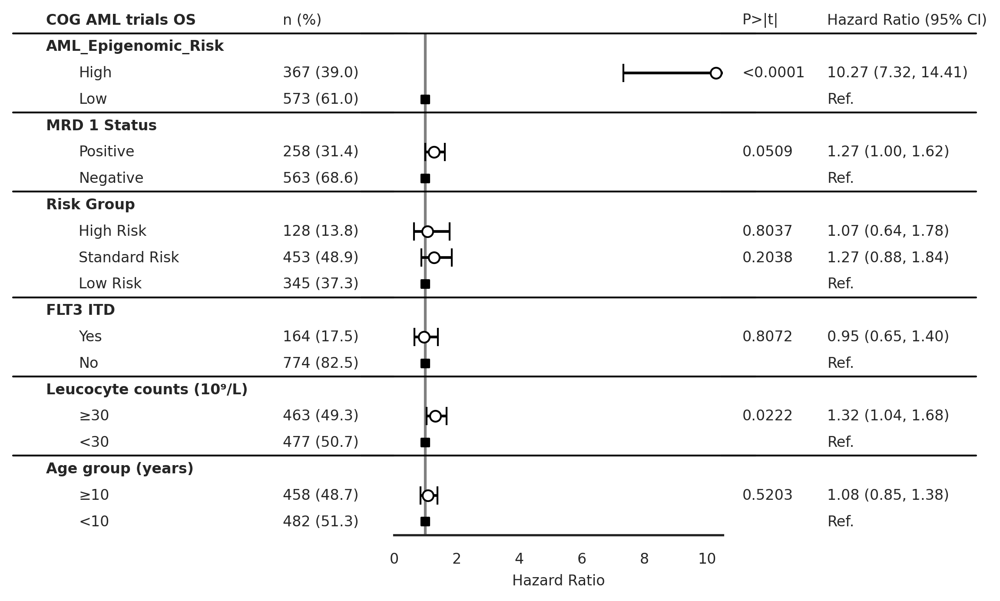

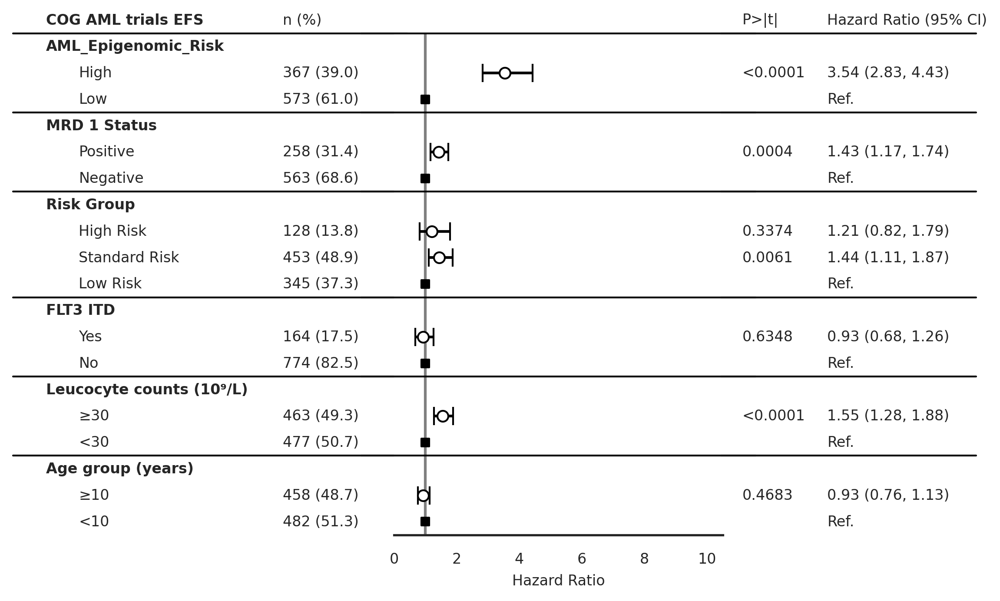

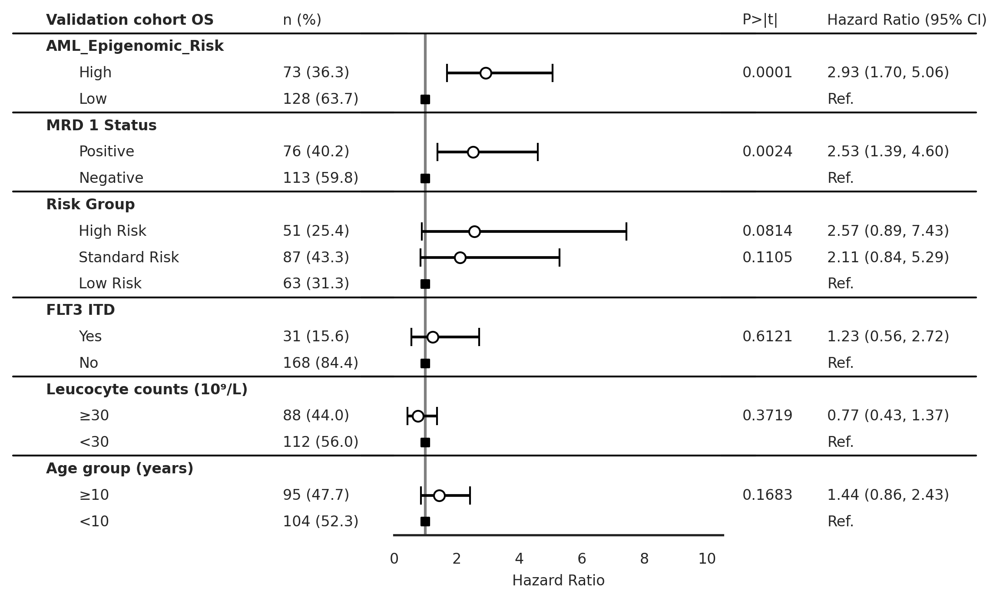

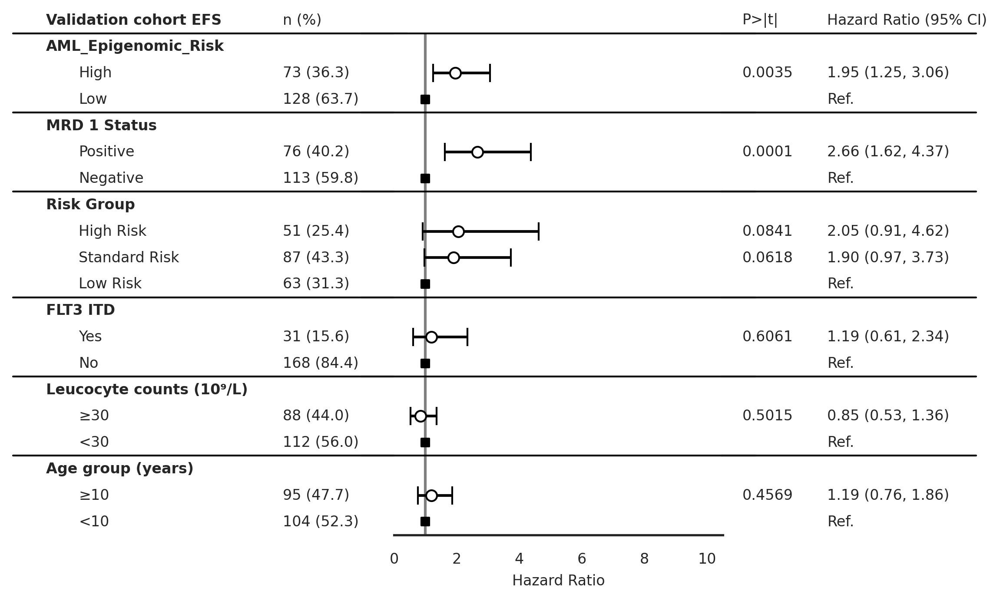

In [13]:
for dataset, trial in zip([df_cog, df_test], ['COG AML trials', 'Validation cohort']):
    
    df_ = dataset.copy()
    df_['AML_Epigenomic_Risk'] = df_['AML Epigenomic Risk'] 

    draw_forest_plot(time='os.time',
                        event='os.evnt',
                        df=df_,
                        trialname=trial,
                        model_name='AML_Epigenomic_Risk',
                        save_plot=False)

    draw_forest_plot(time='efs.time',
                        event='efs.evnt',
                        df=df_,
                        trialname=trial,
                        model_name='AML_Epigenomic_Risk',
                        save_plot=False)


### With MRD 1 and BM blast (%)

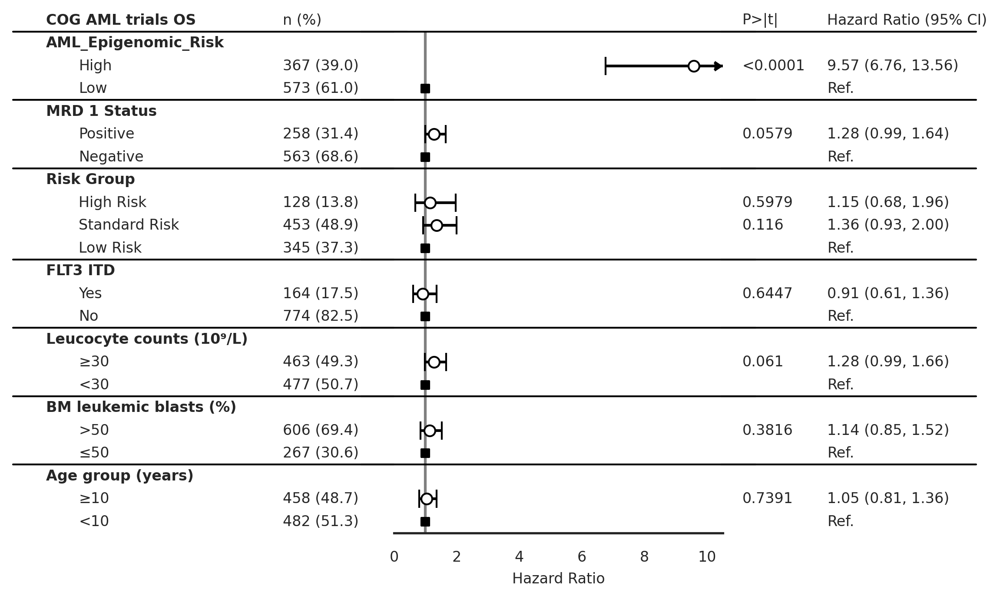

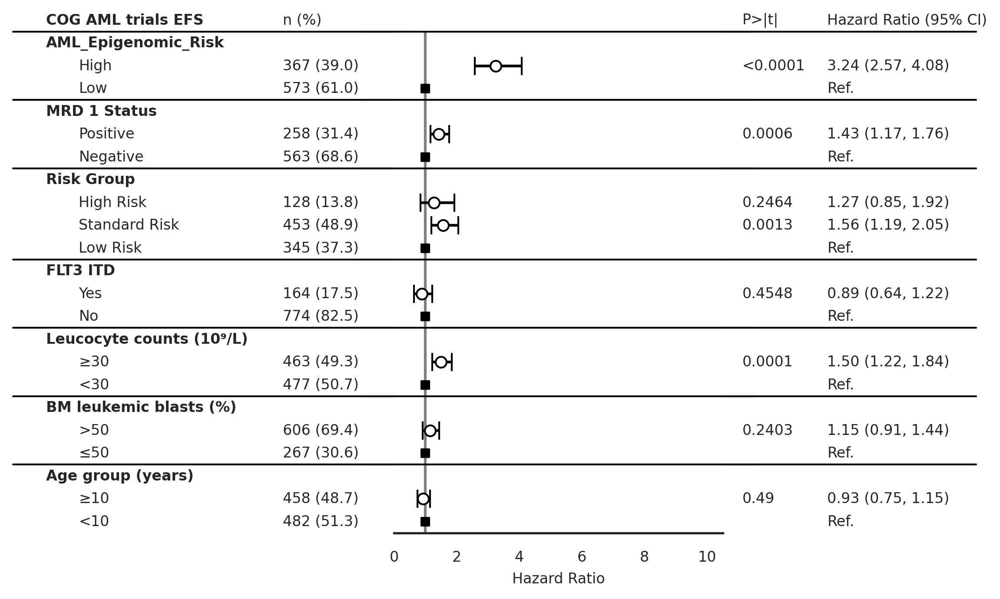

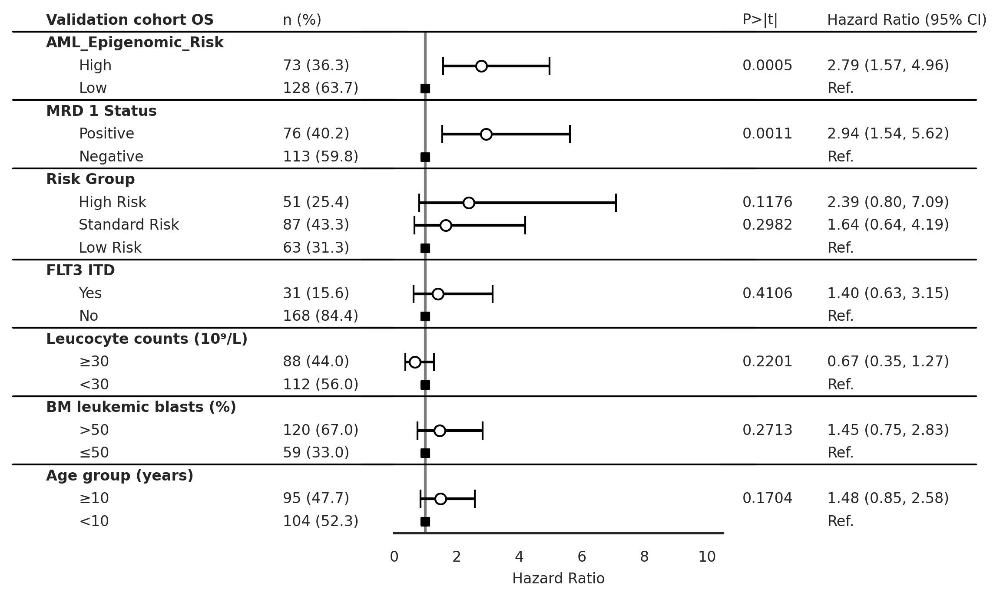

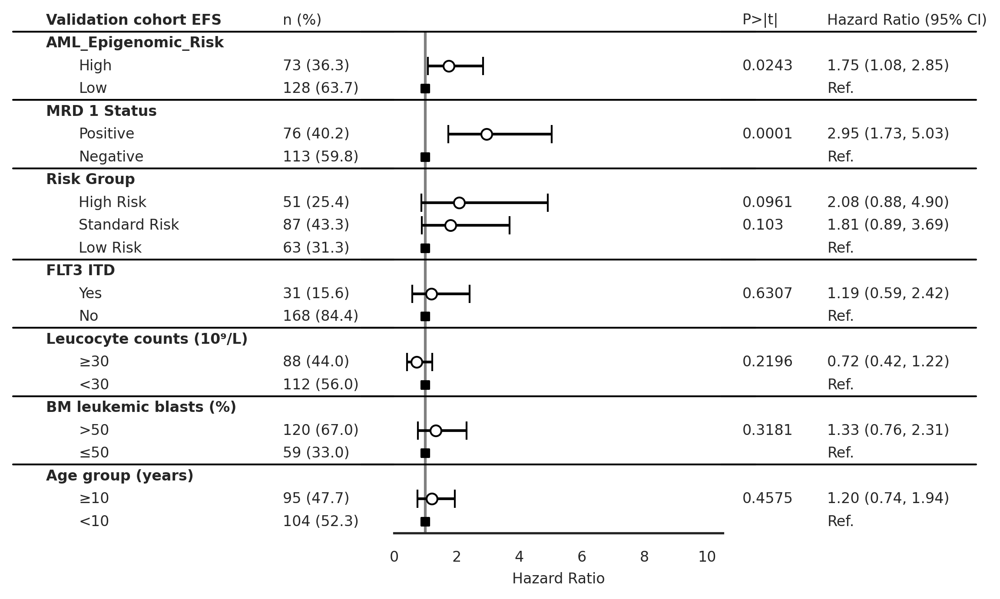

In [14]:
for dataset, trial in zip([df_cog, df_test], ['COG AML trials', 'Validation cohort']):
    
    df_ = dataset.copy()
    df_['BM leukemic blasts (%)'] = pd.cut(df_['BM leukemic blasts (%)'], bins=[0,50,100], labels=['≤50', '>50'])
    df_['AML_Epigenomic_Risk'] = df_['AML Epigenomic Risk'] 

    draw_forest_plot_withBMblast(time='os.time',
                        event='os.evnt',
                        df=df_,
                        trialname=trial,
                        model_name='AML_Epigenomic_Risk',
                        save_plot=False)

    draw_forest_plot_withBMblast(time='efs.time',
                        event='efs.evnt',
                        df=df_,
                        trialname=trial,
                        model_name='AML_Epigenomic_Risk',
                        save_plot=False)


### Without MRD 1

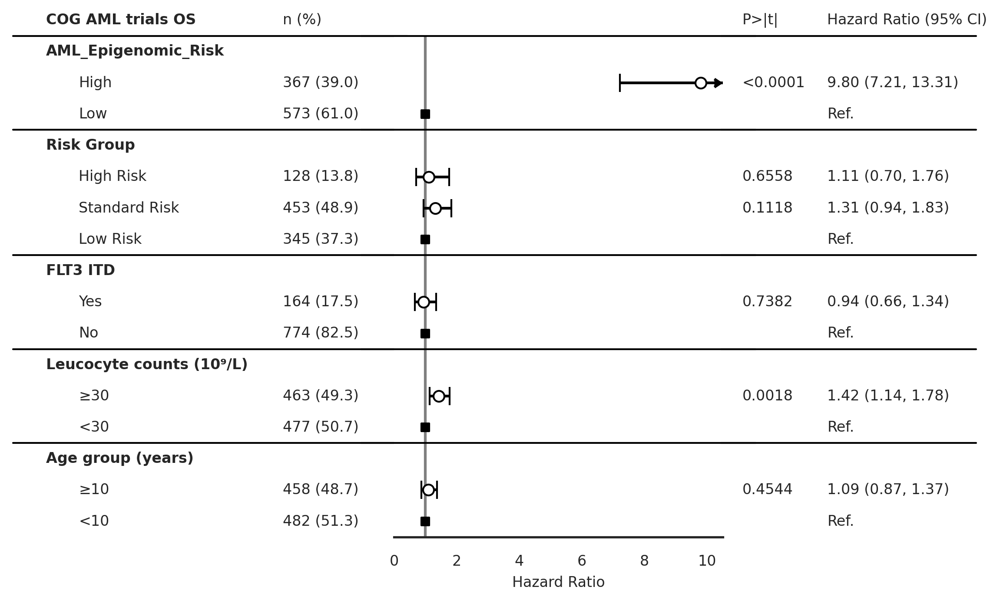

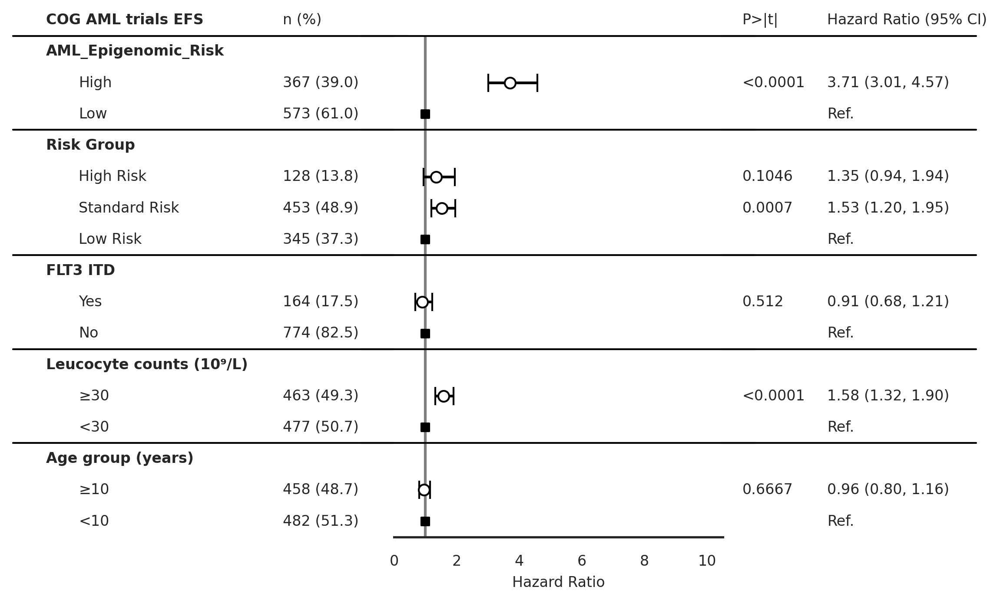

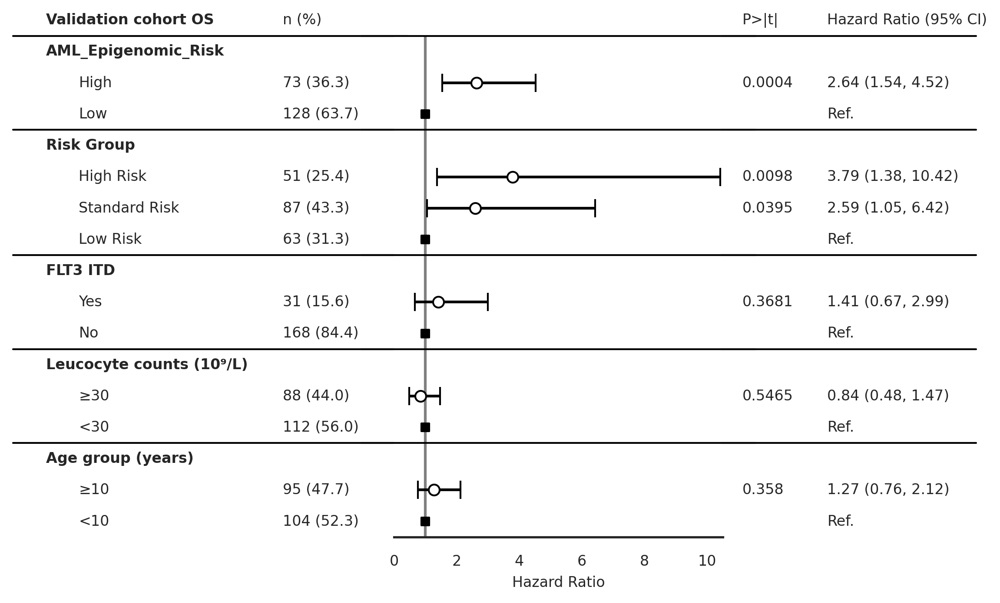

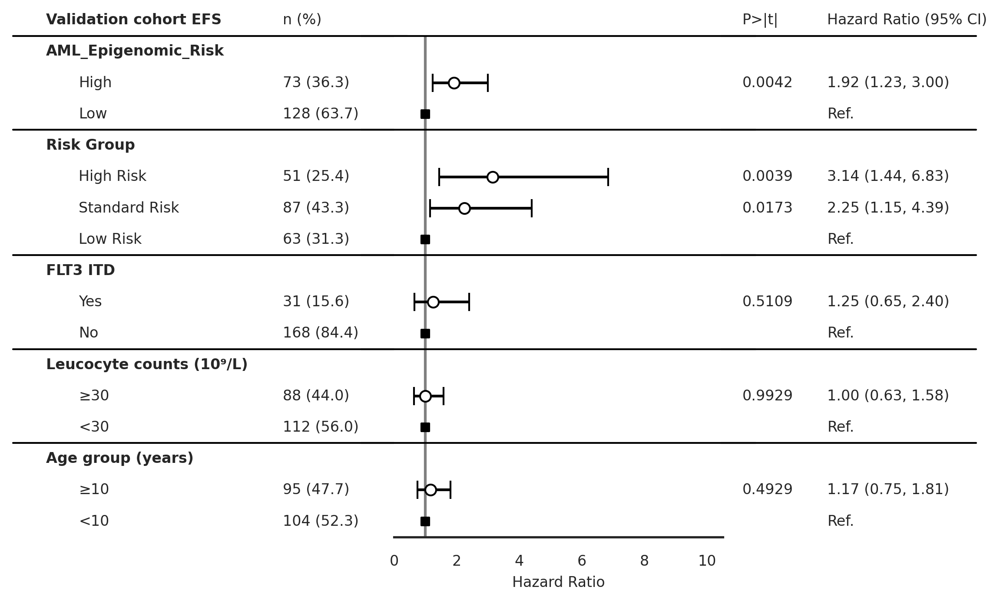

In [15]:
for dataset, trial in zip([df_cog, df_test], ['COG AML trials', 'Validation cohort']):
    
    df_ = dataset.copy()
    df_['BM leukemic blasts (%)'] = pd.cut(df_['BM leukemic blasts (%)'], bins=[0,50,100], labels=['≤50', '>50'])
    df_['AML_Epigenomic_Risk'] = df_['AML Epigenomic Risk'] 

    draw_forest_plot_noMRD(time='os.time',
                        event='os.evnt',
                        df=df_,
                        trialname=trial,
                        model_name='AML_Epigenomic_Risk',
                        save_plot=False)

    draw_forest_plot_noMRD(time='efs.time',
                        event='efs.evnt',
                        df=df_,
                        trialname=trial,
                        model_name='AML_Epigenomic_Risk',
                        save_plot=False)


## ROC AUC performance

### AL epigenomic phenotype

In [16]:
df_dx_auc_train, df_dx_dummies_train = process_dataset_for_multiclass_auc(df_dx)
df_dx_auc_cog, df_dx_dummies_cog = process_dataset_for_multiclass_auc(df_cog)
df_dx_auc_test, df_dx_dummies_test = process_dataset_for_multiclass_auc(df_test)
                                                                        
p1 = plot_multiclass_roc_auc(df_dx_auc_train, df_dx_dummies_train.columns, title='Discovery cohort')
p2 = plot_multiclass_roc_auc(df_dx_auc_cog, df_dx_dummies_cog.columns, title='Discovery COG peds AML Dx')
p3 = plot_multiclass_roc_auc(df_dx_auc_test, df_dx_dummies_test.columns, title='Validation cohort')

# Create a gridplot
p = gridplot([
    [p1, p2, p3,],
    ], toolbar_location='above')

show(p)

### AML epigenomic risk (probability) + risk group

In [18]:
# Probability model
model_name = 'P(Death)'
p1 = plot_roc_auc_with_riskgroup(df_px, 'os.evnt', model_name , title='Discovery cohort')
p2 = plot_roc_auc_with_riskgroup(df_cog, 'os.evnt', model_name, title='Discovery COG peds AML Dx')
p3 = plot_roc_auc_with_riskgroup(df_test, 'os.evnt', model_name, title='Validation cohort')


p4 = plot_roc_auc_with_riskgroup(df_px, 'os.evnt', model_name , sum_models=True)
p5 = plot_roc_auc_with_riskgroup(df_cog, 'os.evnt', model_name, sum_models=True)
p6 = plot_roc_auc_with_riskgroup(df_test, 'os.evnt', model_name, sum_models=True)

# Create a gridplot
p = gridplot([
    [p1, p2, p3,],
    [p4, p5, p6,],
    ], toolbar_location='above')

show(p)

```{note}
Sample size may be reduced in the ROC AUC because samples with missing risk group data were removed.
```

### AML epigenomic risk (high-low) + risk group

In [19]:
# Binary model
model_name = 'AML Epigenomic Risk'
p1 = plot_roc_auc_with_riskgroup(df_px, 'os.evnt', model_name , title='Discovery cohort')
p2 = plot_roc_auc_with_riskgroup(df_cog, 'os.evnt', model_name, title='Discovery COG peds AML Dx')
p3 = plot_roc_auc_with_riskgroup(df_test, 'os.evnt', model_name, title='Validation cohort')


p4 = plot_roc_auc_with_riskgroup(df_px, 'os.evnt', model_name , sum_models=True)
p5 = plot_roc_auc_with_riskgroup(df_cog, 'os.evnt', model_name, sum_models=True)
p6 = plot_roc_auc_with_riskgroup(df_test, 'os.evnt', model_name, sum_models=True)

# Create a gridplot
p = gridplot([
    [p1, p2, p3,],
    [p4, p5, p6,],
    ], toolbar_location='above')

show(p)

### AML epigenomic risk + latest risk group (AAML1831 COG)

In [21]:
# Probability model
model_name = 'P(Death)'
p1 = plot_roc_auc_with_riskgroup(df_cog, 'os.evnt', model_name ,risk_group='Risk Group' ,title='Risk group AAML1031-0531')
p2 = plot_roc_auc_with_riskgroup(df_cog, 'os.evnt', model_name, risk_group='Risk Group AAML1831' ,title='Risk group AAML1831')
p3 = plot_roc_auc_with_riskgroup(df_cog, 'os.evnt', model_name, risk_group='Risk Group AAML1831', sum_models=True, title='Risk group AAML1831 + Epigenomic Risk')

# Binary model
model_name = 'AML Epigenomic Risk'
p4 = plot_roc_auc_with_riskgroup(df_cog, 'os.evnt', model_name ,risk_group='Risk Group')
p5 = plot_roc_auc_with_riskgroup(df_cog, 'os.evnt', model_name, risk_group='Risk Group AAML1831')
p6 = plot_roc_auc_with_riskgroup(df_cog, 'os.evnt', model_name, risk_group='Risk Group AAML1831', sum_models=True)

# Create a gridplot
p = gridplot([
    [p1, p2, p3,],
    [p4, p5, p6,],
    ], toolbar_location='above')

show(p)

## Box Plots

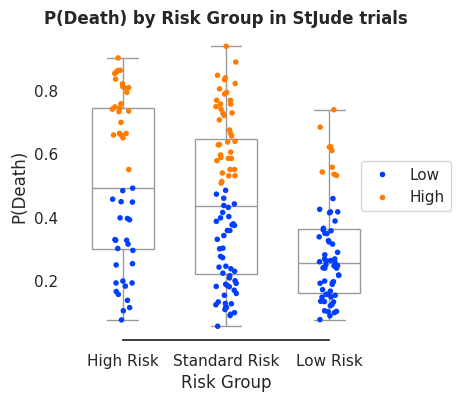

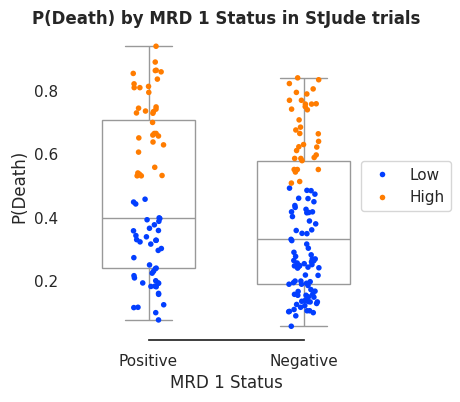

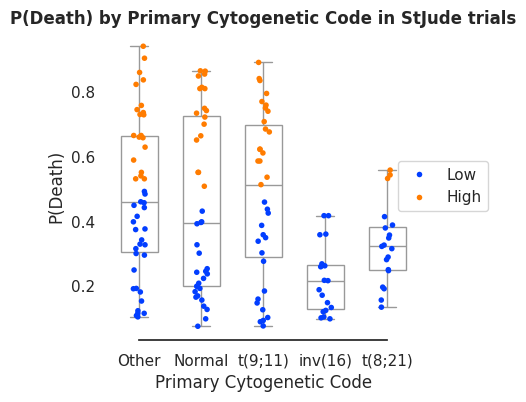

In [23]:
draw_boxplot(df=df_test,x='Risk Group', y='P(Death)',
                order=['High Risk', 'Standard Risk', 'Low Risk'],
                trialname='StJude trials', hue=model_name,
                save_plot=False, figsize=(4,4))

draw_boxplot(df=df_test,x='MRD 1 Status', y='P(Death)',
                order=['Positive','Negative'],
                trialname='StJude trials', hue=model_name,
                save_plot=False, figsize=(4,4))

draw_boxplot(df=df_test,x='Primary Cytogenetic Code', y='P(Death)',
                order='auto',
                trialname='StJude trials', hue=model_name,
                save_plot=False, figsize=(4,4))

## Stacked Bar Plots

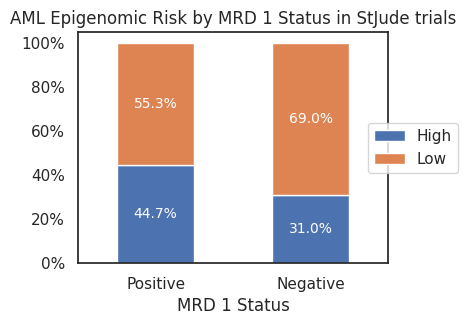

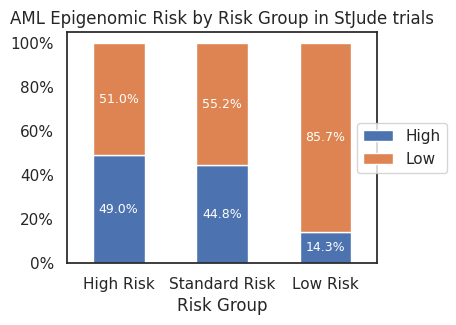

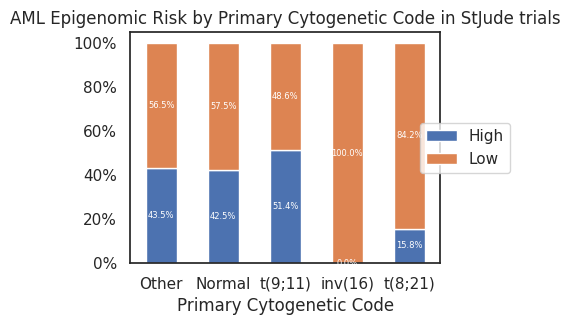

In [24]:
model_name = 'AML Epigenomic Risk'
draw_stacked_barplot(df=df_test,x='MRD 1 Status', y=model_name,
             order=['Positive','Negative'],
             trialname='StJude trials', hue=model_name,
             save_plot=False, figsize=(4,3))

draw_stacked_barplot(df=df_test,x='Risk Group', y=model_name,
                order=['High Risk', 'Standard Risk', 'Low Risk'],
                trialname='StJude trials', hue=model_name,
                save_plot=False, figsize=(4,3), fontsize=9)

draw_stacked_barplot(df=df_test,x='Primary Cytogenetic Code', y=model_name,
                order='auto',
                trialname='StJude trials', hue=model_name,
                save_plot=False, figsize=(4,3), fontsize=6)



## Sankey plots

```{note}
Sankey plots below compare the distribution of categories. The width of the lines is proportional to the number of patients in each group.
```

### Samples with annotated diagnosis info

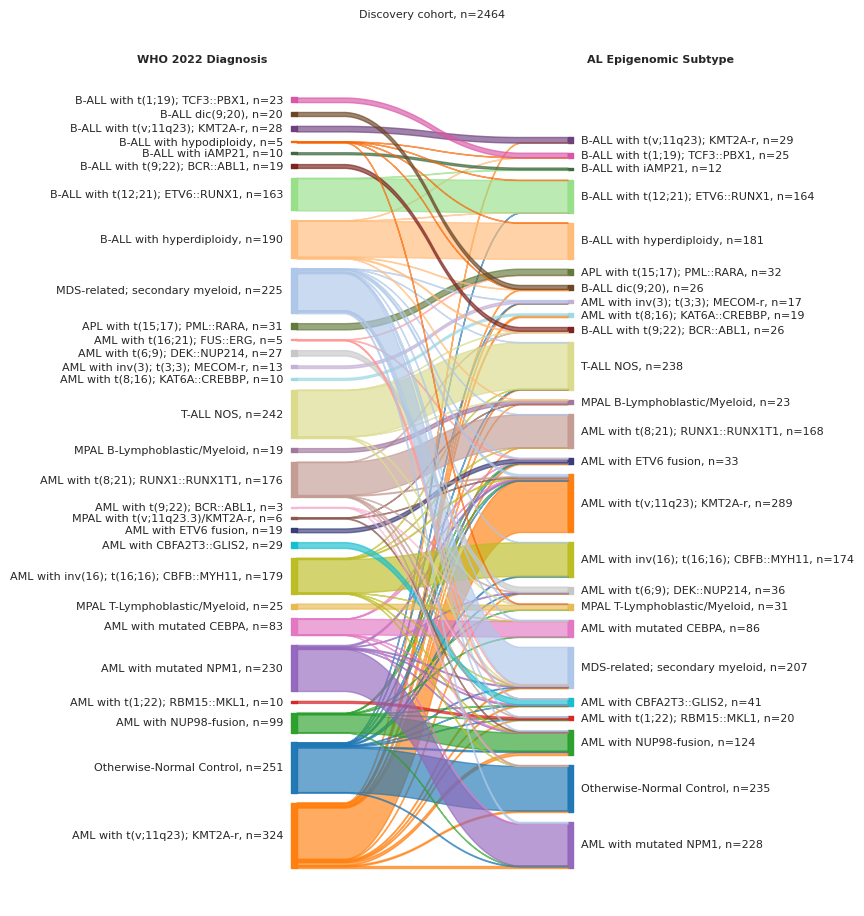

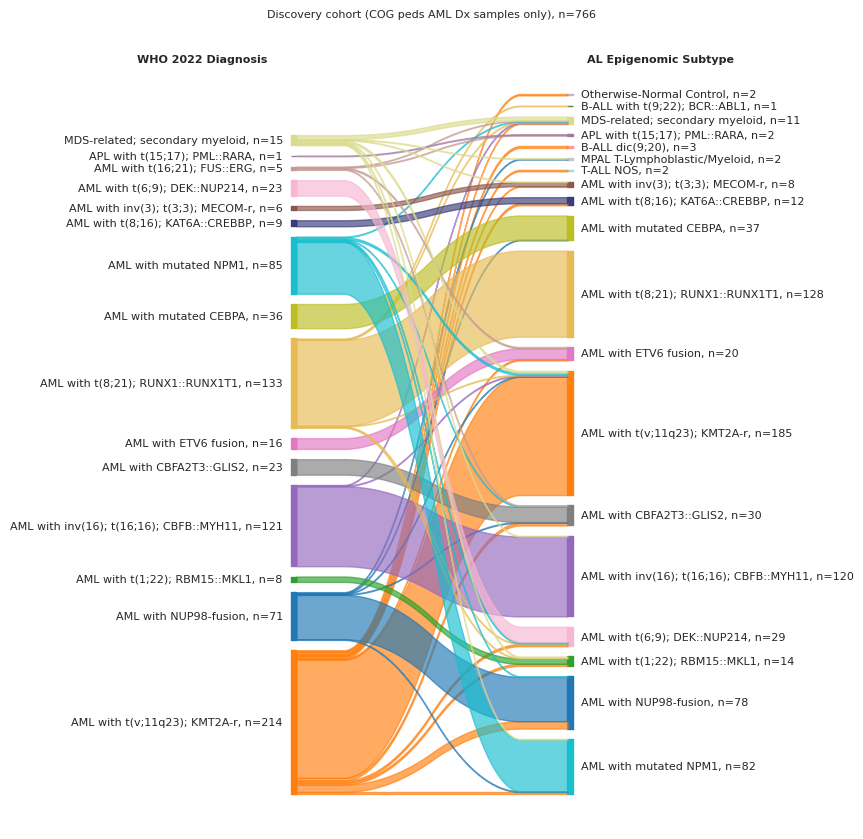

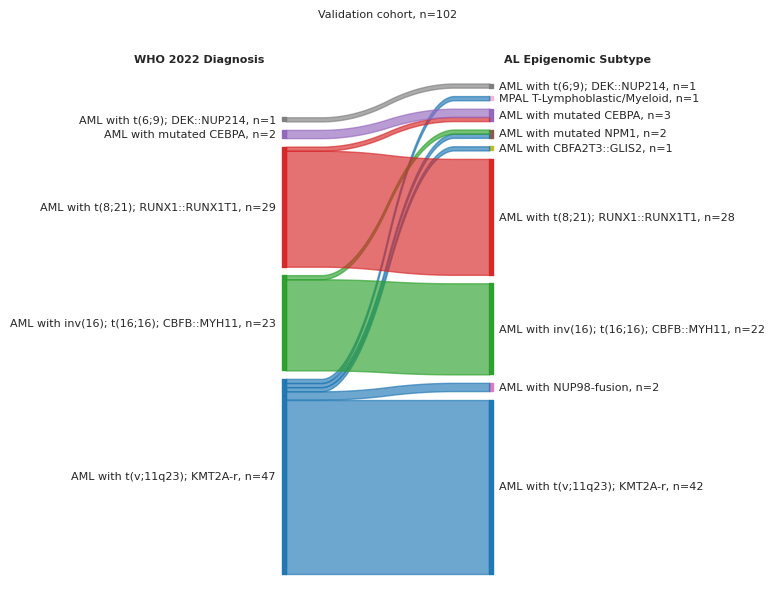

In [26]:
colors = get_custom_color_palette()


draw_sankey_plot(df_train, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title='Discovery cohort', fig_size=(4, 11),
                 fontsize=8, nan_action='drop')

draw_sankey_plot(df_cog, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(4, 10),
                 fontsize=8, nan_action='drop')

draw_sankey_plot(df_test, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title= 'Validation cohort',fig_size=(3, 7),
                 fontsize=8, nan_action='drop')

### Predictions in samples for which no WHO 22 Dx data was available

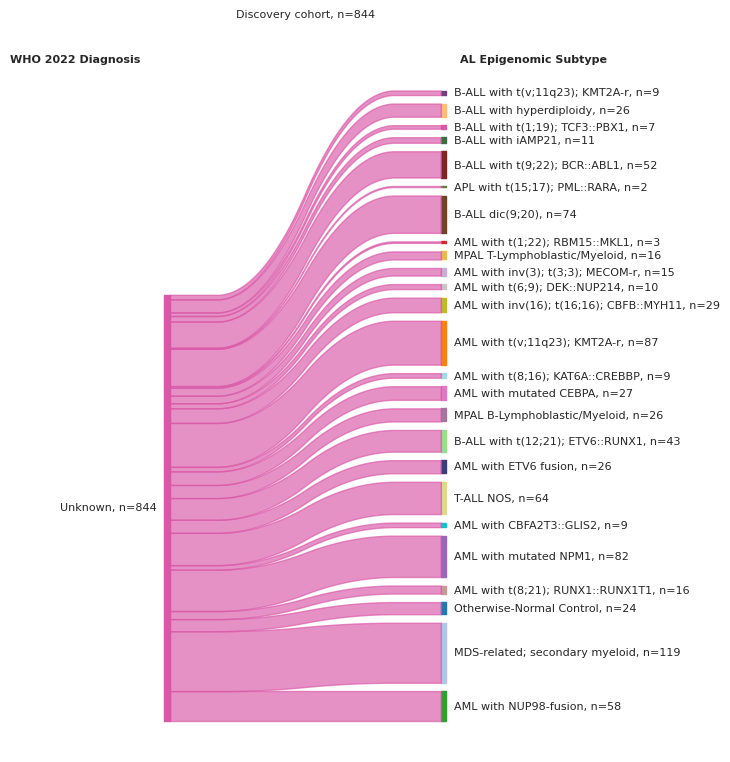

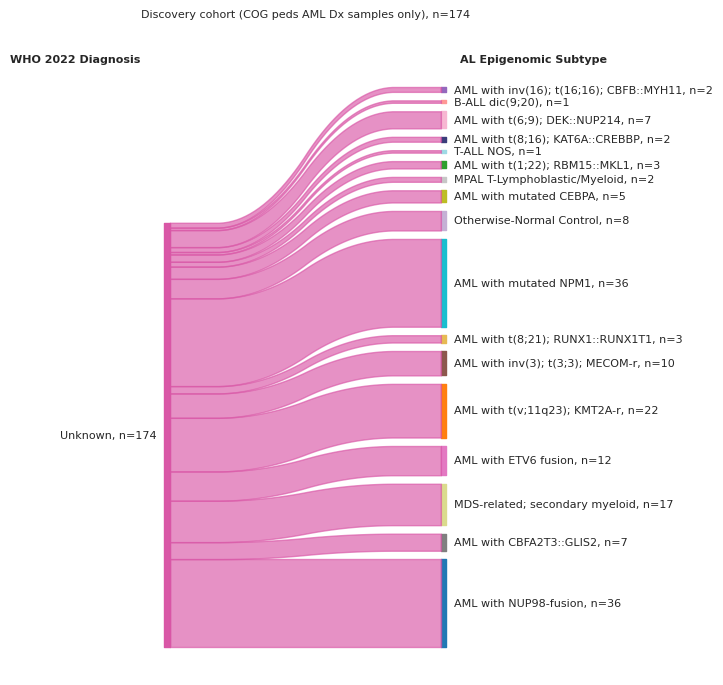

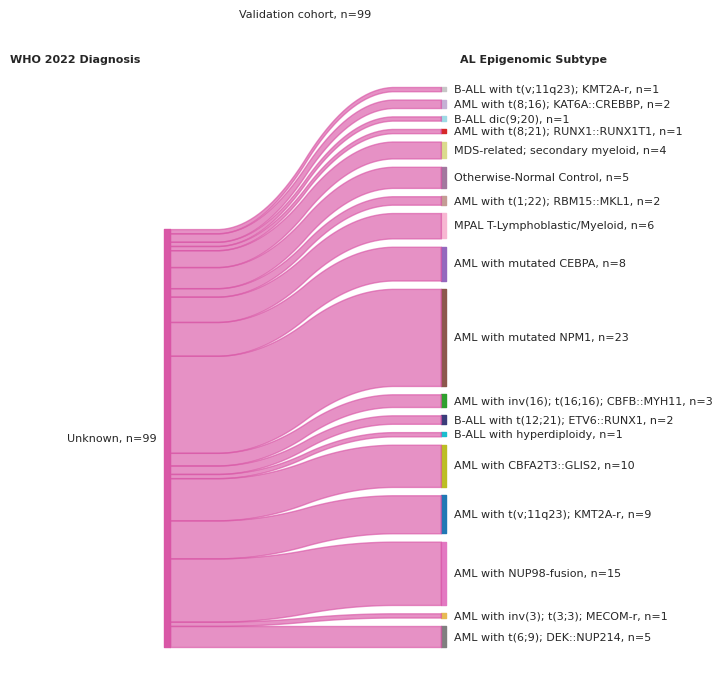

In [27]:
draw_sankey_plot(df_train, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title='Discovery cohort', fig_size=(4, 9),
                 fontsize=8, nan_action='keep only')

draw_sankey_plot(df_cog, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(4, 8),
                 fontsize=8, nan_action='keep only')

draw_sankey_plot(df_test, 'WHO 2022 Diagnosis', 'AL Epigenomic Subtype', colors,
                 title= 'Validation cohort',fig_size=(4, 8),
                 fontsize=8, nan_action='keep only')

### Reason for unclassified samples

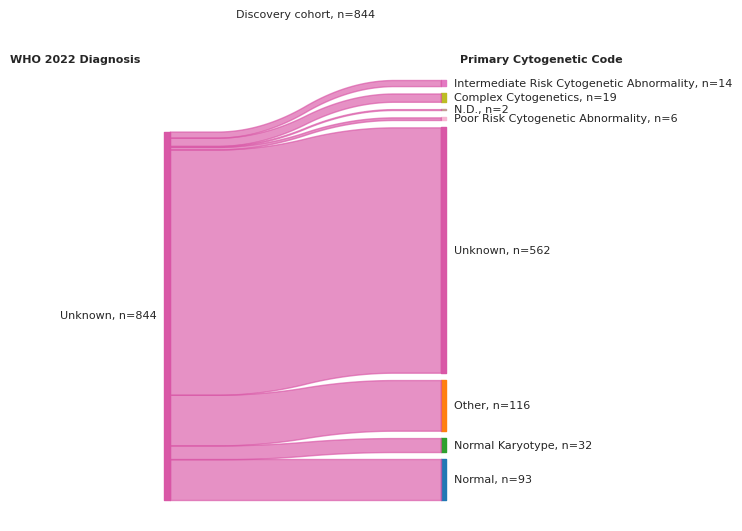

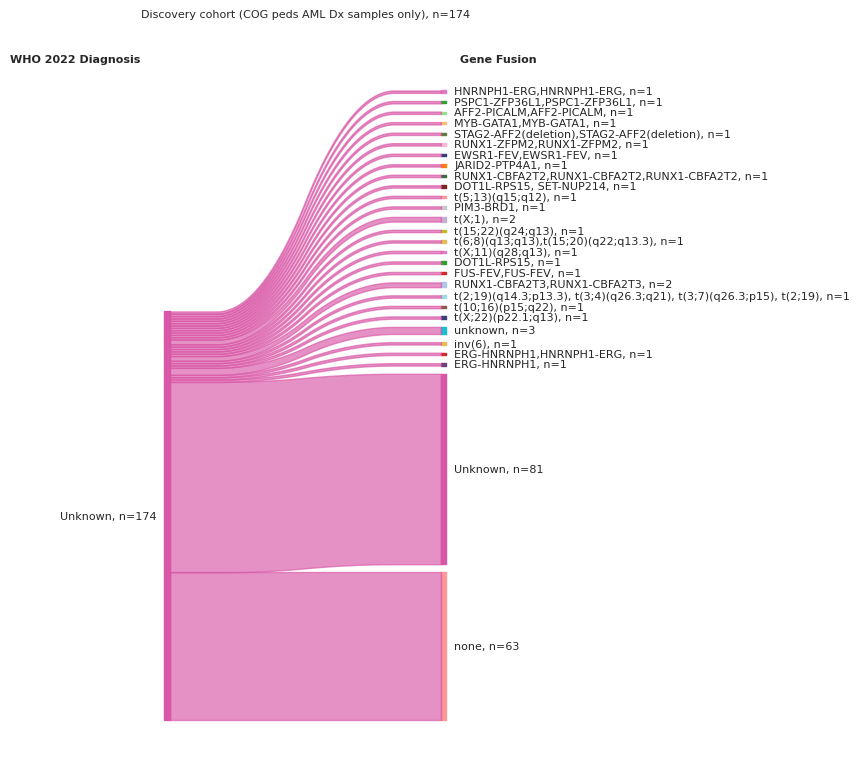

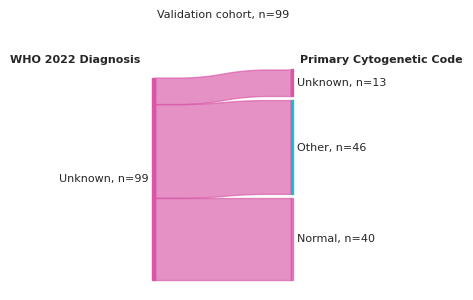

In [28]:
draw_sankey_plot(df_train, 'WHO 2022 Diagnosis', 'Primary Cytogenetic Code', colors,
                 title='Discovery cohort', fig_size=(4, 6),
                 fontsize=8, nan_action='keep only')

draw_sankey_plot(df_cog, 'WHO 2022 Diagnosis', 'Gene Fusion', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(4, 9),
                 fontsize=8, nan_action='keep only')

draw_sankey_plot(df_test, 'WHO 2022 Diagnosis', 'Primary Cytogenetic Code', colors,
                 title= 'Validation cohort',fig_size=(2, 3),
                 fontsize=8, nan_action='keep only')

### Risk group comparison in COG

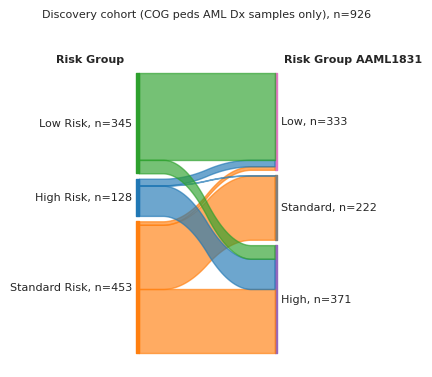

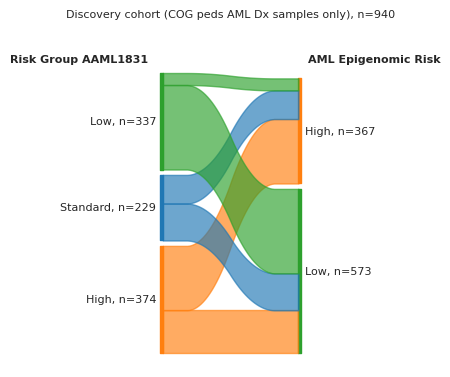

In [29]:
draw_sankey_plot(df_cog, 'Risk Group', 'Risk Group AAML1831', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(2, 4),
                 fontsize=8, nan_action='drop')

draw_sankey_plot(df_cog, 'Risk Group AAML1831', 'AML Epigenomic Risk', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(2, 4),
                 fontsize=8, nan_action='drop')

### Px and Dx model comparison

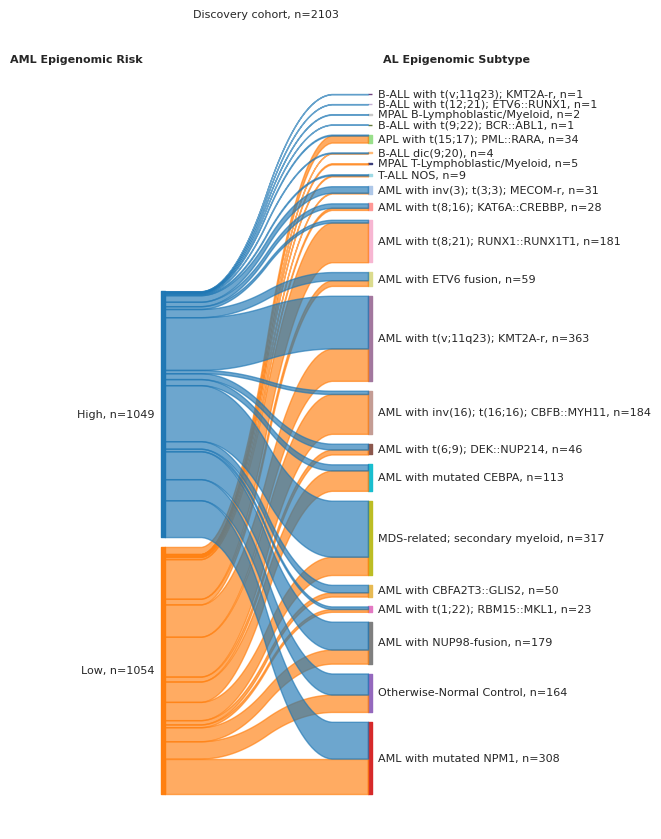

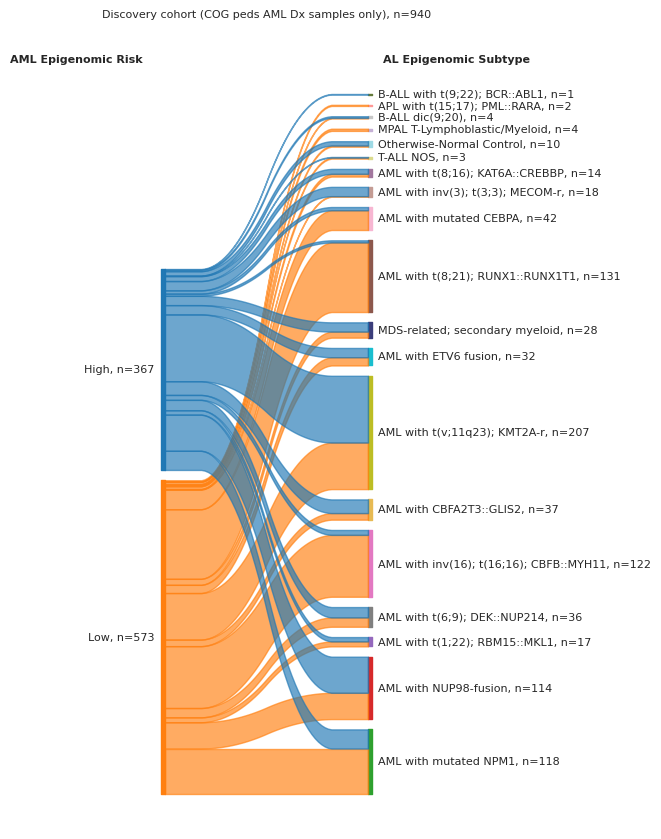

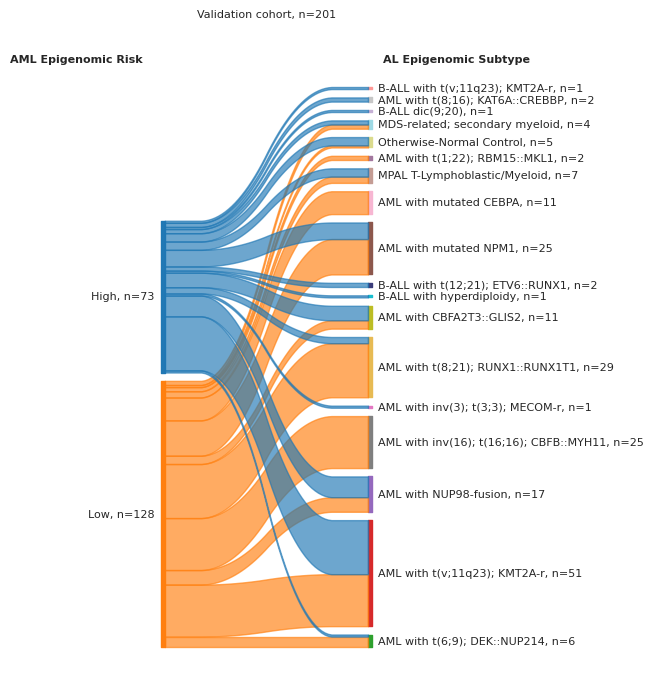

In [30]:
draw_sankey_plot(df_train, 'AML Epigenomic Risk', 'AL Epigenomic Subtype', colors,
                 title='Discovery cohort', fig_size=(3, 10),
                 fontsize=8, nan_action='drop')

draw_sankey_plot(df_cog, 'AML Epigenomic Risk', 'AL Epigenomic Subtype', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(3, 10),
                 fontsize=8, nan_action='drop')

draw_sankey_plot(df_test, 'AML Epigenomic Risk', 'AL Epigenomic Subtype', colors,
                 title= 'Validation cohort',fig_size=(3, 8),
                 fontsize=8, nan_action='drop')

## Watermark

In [31]:
%load_ext watermark

In [32]:
# watermark with all libraries used in this notebook
%watermark -v -p pandas,seaborn,matplotlib,tableone,sklearn,lifelines,statannotations -a Francisco_Marchi@Lamba_Lab_UF -d -m

Author: Francisco_Marchi@Lamba_Lab_UF

Python implementation: CPython
Python version       : 3.10.11
IPython version      : 8.20.0

pandas         : 2.2.0
seaborn        : 0.13.2
matplotlib     : 3.8.2
tableone       : 0.8.0
sklearn        : 1.4.0
lifelines      : 0.28.0
statannotations: not installed

Compiler    : GCC 11.3.0
OS          : Linux
Release     : 5.15.133.1-microsoft-standard-WSL2
Machine     : x86_64
Processor   : x86_64
CPU cores   : 20
Architecture: 64bit

